In [1]:
%runfile H3.py

In [45]:
from utils import (make_M_alphas, 
                   make_poly_from_edges,
                   poly_equiv, tri0, tri1, tri2, cycle_poly, std_poly,
                   poly_gl2_orbit_reps, 
                   aas_triangle_gl2_orbit_reps, 
                   square_parameters, 
                   aaa_triangle_parameters, 
                   aas_triangle_parameters)

In [23]:
kdata = make_k(-19)
k = kdata['k']
w = kdata['w']
wbar = w.trace()-w
zero = k(0)
one = k(1)
Ireps = kdata['Ireps']
Ok = kdata['Ok']
inf = cusp(infinity, k)

In [39]:
alphas = precomputed_alphas(k)
assert alphas == [cusp(zero), cusp(w/2), cusp((w-1)/2)]

sigmas = singular_points_new(k)
assert sigmas == [inf]

M_alphas, alpha_inv = make_M_alphas(alphas)

In [26]:
polys = all_polyhedra(k)[0]

New orbit from P_0=[7/19*w + 6/19, 2/19]: {0}
New orbit from P_1=[-7/19*w + 13/19, 2/19]: {1}
New orbit from P_2=[-8/19*w + 4/19, 3/19]: {2}
New orbit from P_3=[8/19*w - 4/19, 3/19]: {3}
Found [[3], [2], [1], [0]] orbits:
Constructed 4 polyhedra
Faces: [[4, 3, 4, 3, 4], [4, 4, 3, 3, 4], [4, 3, 4, 3, 4, 4, 3, 3, 4, 3, 4, 3, 3, 3], [4, 3, 4, 3, 4, 4, 3, 3, 4, 3, 4, 3, 3, 3]]


In [27]:
assert len(polys)==4
G1, G2, G3, G4 = polys

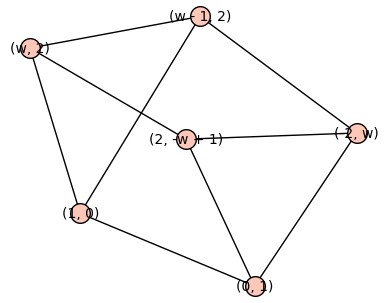

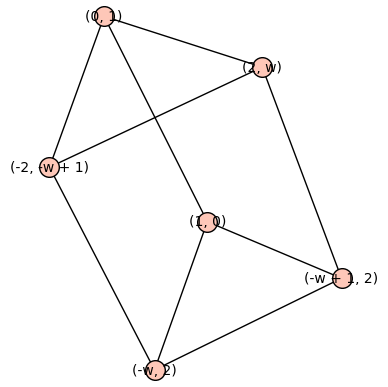

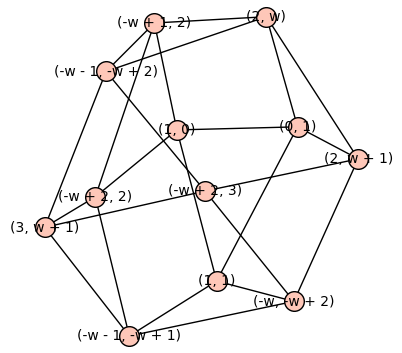

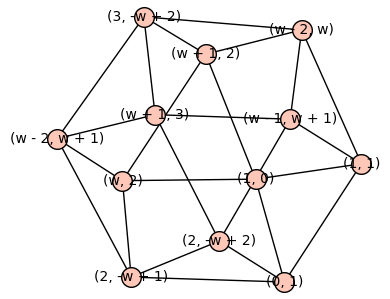

In [28]:
for G in polys: show(G)

In [40]:
triangles = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==3] for G in polys],[])]
squares = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==4] for G in polys],[])]
hexagons = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==6] for G in polys],[])]
aaa_triangles = [T for T in triangles if is_poly_principal(T)]
#aas_triangles = [T for T in triangles if not is_poly_principal(T)]

In [41]:
[len(t) for t in [aaa_triangles, squares, hexagons]]

[20, 18, 0]

In [42]:
aaa_triangles0 = poly_gl2_orbit_reps(aaa_triangles, alphas)
squares0 = poly_gl2_orbit_reps(squares, alphas)
hexagons0 = poly_gl2_orbit_reps(hexagons, alphas)

In [43]:
[len(t) for t in [aaa_triangles0, squares0, hexagons0]]

[2, 1, 0]

In [44]:
[square_parameters(S, alphas, M_alphas, alpha_inv) for S in squares0]

[[[0, 2, 0, 2], [0, 0, 0]]]

In [34]:
[aas_triangle_parameters(T, alphas, M_alphas, sigmas) for T in aas_triangles0]

[]

In [46]:
triangles1 = [T for T in aaa_triangles0 if not any(poly_equiv(T, t) for t in [tri0(k), tri1(k), tri2(k)])]
triangles1

[]

In [47]:
[aaa_triangle_parameters(T, alphas, M_alphas) for T in triangles1]# if not poly_equiv(T, tri0)]

[]

In [48]:
S = alphas+alpha_triples(alphas)[1]
Hlist = [(to_k(a),1/a.denominator().norm()) for a in S]
print([a[0] for a in Hlist])

[0, 1/2*w, 1/2*w - 1/2, 1, -1/2*w + 1, -1/2*w, -1/2*w + 1/2]


In [49]:
plot_Bianchi_diagram(k,Hlist)

Graphics3d Object